In [4]:
from pm4py.objects.log.importer.xes import importer as xes_importer

In [5]:
log = xes_importer.apply('Hospital Billing - Event Log.xes')

In [9]:
print(log[1])

{'attributes': {'concept:name': 'B'}, 'events': [{'isCancelled': False, 'diagnosis': 'B', 'time:timestamp': datetime.datetime(2012, 12, 16, 19, 33, 50, tzinfo=datetime.timezone(datetime.timedelta(seconds=3600))), 'caseType': 'A', 'speciality': 'A', 'org:resource': 'ResA', 'concept:name': 'NEW', 'blocked': False, 'isClosed': False, 'flagD': False, 'flagB': False, 'flagA': False, 'state': 'In progress', 'lifecycle:transition': 'complete'}, '..', {'isCancelled': True, 'org:resource': 'ResC', 'state': 'In progress', 'concept:name': 'DELETE', 'lifecycle:transition': 'complete', 'time:timestamp': datetime.datetime(2013, 10, 19, 12, 37, 5, tzinfo=datetime.timezone(datetime.timedelta(seconds=7200)))}]}


In [10]:
variant = xes_importer.Variants.ITERPARSE
parameters = {variant.value.Parameters.TIMESTAMP_SORT: True}

In [11]:
log = xes_importer.apply('Hospital Billing - Event Log.xes',
                         variant=variant, parameters=parameters)

In [12]:
print(log[1])

{'attributes': {'concept:name': 'R'}, 'events': [{'isCancelled': False, 'diagnosis': 'S', 'time:timestamp': datetime.datetime(2012, 12, 13, 11, 12, 5, tzinfo=datetime.timezone(datetime.timedelta(seconds=3600))), 'caseType': 'A', 'speciality': 'I', 'org:resource': 'ResV', 'concept:name': 'NEW', 'blocked': False, 'isClosed': True, 'flagD': True, 'flagB': False, 'flagA': False, 'state': 'In progress', 'lifecycle:transition': 'complete'}, '..', {'org:resource': 'ResB', 'state': 'Billed', 'concept:name': 'BILLED', 'lifecycle:transition': 'complete', 'time:timestamp': datetime.datetime(2013, 3, 31, 9, 54, 25, tzinfo=datetime.timezone(datetime.timedelta(seconds=7200)))}]}


In [13]:
from pm4py.algo.discovery.inductive import algorithm as discovery_algorithm
model,marking_i,marking_f = discovery_algorithm.apply(log)

In [16]:
print(model)

In [17]:
print(marking_i)

['source:1']


In [18]:
print(marking_f)

['sink:1']


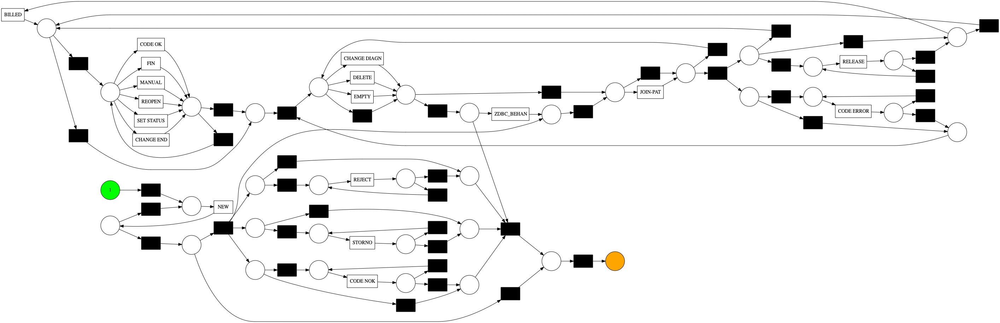

In [19]:
from pm4py.visualization.petrinet import visualizer as pn_visualizer

pn_visualizer.view(pn_visualizer.apply(model, marking_i, marking_f, parameters = {'format':'jpg'}))

In [71]:
num_events= len(log)
num_events

100000

In [ ]:
#A variant is a set of cases that share the same control-flow perspective, so a set of cases that share the same
#classified events (activities) in the same order.
#shows the most frequent paths in our process

In [82]:
from pm4py.statistics.variants.log import get as variants_module
language = variants_module.get_language(log)
print(language)



{('NEW', 'CHANGE DIAGN', 'FIN', 'RELEASE', 'CODE OK', 'RELEASE', 'CODE OK', 'BILLED'): 0.00028, ('NEW', 'CHANGE DIAGN', 'FIN', 'RELEASE', 'CODE OK', 'BILLED'): 0.33673, ('NEW', 'DELETE'): 0.04813, ('NEW', 'FIN', 'RELEASE', 'CODE OK', 'BILLED'): 0.20902, ('NEW',): 0.22373, ('NEW', 'FIN', 'RELEASE', 'DELETE'): 0.00125, ('NEW', 'CHANGE DIAGN', 'CHANGE DIAGN', 'FIN', 'RELEASE', 'CODE OK', 'BILLED'): 0.02121, ('NEW', 'FIN', 'RELEASE', 'CODE OK', 'MANUAL', 'RELEASE', 'CODE OK', 'REOPEN', 'FIN', 'RELEASE', 'CODE OK', 'BILLED'): 2e-05, ('NEW', 'CHANGE DIAGN', 'FIN', 'RELEASE', 'CODE OK', 'BILLED', 'STORNO', 'BILLED'): 0.00256, ('NEW', 'CHANGE DIAGN', 'FIN', 'RELEASE', 'CODE OK', 'REOPEN', 'FIN', 'RELEASE', 'CODE OK', 'BILLED'): 0.00869, ('NEW', 'FIN', 'RELEASE', 'BILLED'): 0.00359, ('NEW', 'FIN'): 0.03508, ('NEW', 'CHANGE DIAGN', 'FIN', 'RELEASE', 'CODE OK', 'BILLED', 'STORNO', 'REJECT', 'RELEASE', 'CODE OK', 'BILLED'): 0.00091, ('NEW', 'CHANGE DIAGN', 'CHANGE DIAGN', 'CHANGE DIAGN', 'FIN', 'R

In [84]:
from pm4py.algo.filtering.log.variants import variants_filter

variants = variants_filter.get_variants(log)

In [85]:
variants

{'NEW,CHANGE DIAGN,FIN,RELEASE,CODE OK,RELEASE,CODE OK,BILLED': [{'attributes': {'concept:name': 'RB'}, 'events': [{'isCancelled': False, 'time:timestamp': datetime.datetime(2012, 12, 13, 10, 13, 18, tzinfo=datetime.timezone(datetime.timedelta(seconds=3600))), 'caseType': 'B', 'speciality': 'C', 'org:resource': 'ResN', 'concept:name': 'NEW', 'blocked': False, 'isClosed': True, 'flagD': True, 'flagB': False, 'flagA': False, 'state': 'In progress', 'lifecycle:transition': 'complete'}, '..', {'org:resource': 'ResB', 'state': 'Billed', 'concept:name': 'BILLED', 'lifecycle:transition': 'complete', 'time:timestamp': datetime.datetime(2013, 3, 12, 3, 30, 32, tzinfo=datetime.timezone(datetime.timedelta(seconds=3600)))}]},
  {'attributes': {'concept:name': 'CHC'}, 'events': [{'isCancelled': False, 'time:timestamp': datetime.datetime(2013, 1, 9, 14, 3, 42, tzinfo=datetime.timezone(datetime.timedelta(seconds=3600))), 'caseType': 'B', 'speciality': 'E', 'org:resource': 'ResDA', 'concept:name': 'NE

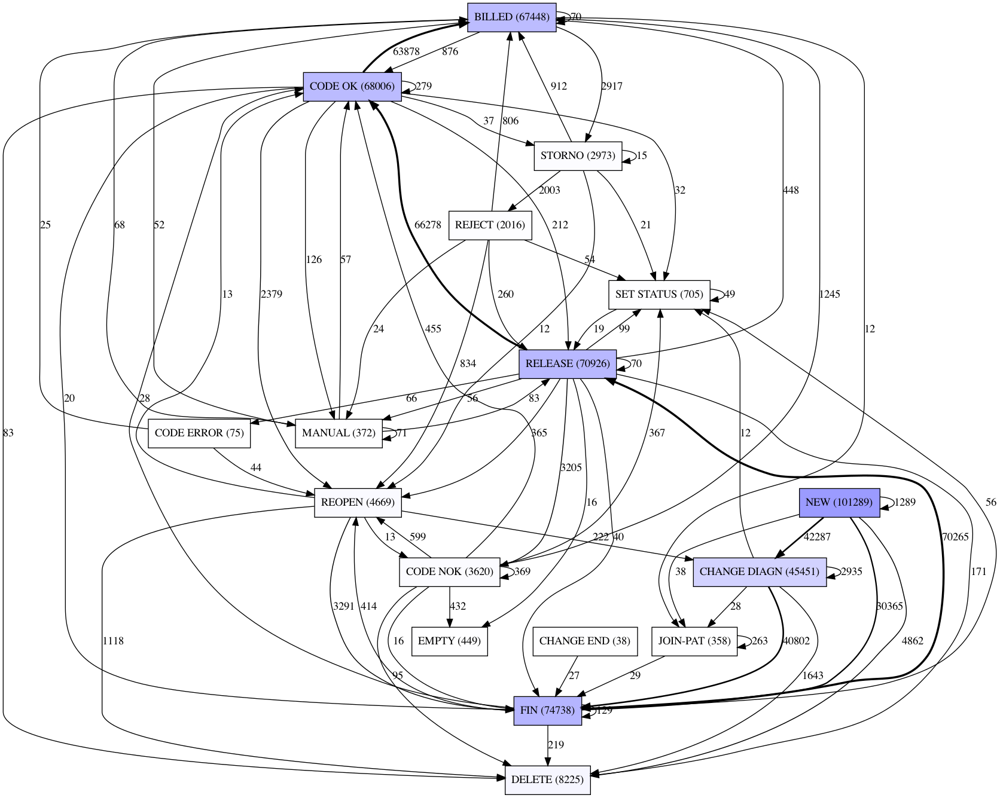

In [98]:
import os
from pm4py.objects.log.importer.xes import importer as xes_importer
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery

dfg = dfg_discovery.apply(log)

from pm4py.visualization.dfg import visualizer as dfg_visualization
gviz = dfg_visualization.apply(dfg, log=log, variant=dfg_visualization.Variants.FREQUENCY)
dfg_visualization.view(gviz)

In [102]:
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
dfg = dfg_discovery.apply(log)

from pm4py.objects.conversion.dfg import converter as dfg_mining
net, im, fm = dfg_mining.apply(dfg)



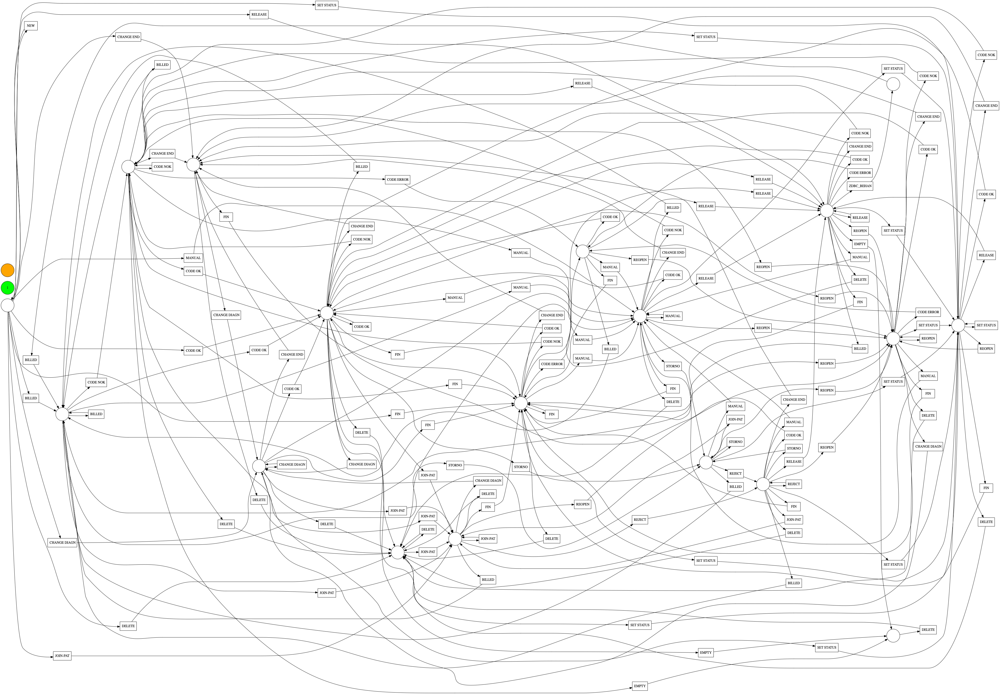

In [103]:
from pm4py.visualization.petrinet import visualizer as pn_visualizer

pn_visualizer.view(pn_visualizer.apply(net, im, fm, parameters = {'format':'jpg'}))